# Project: Analyze Reddit's view of Taiwan

## 社群媒體分析期末專案

第25組 數據礦工
- N114020008 黃品堯 資管碩專班
- N114020007 陳嘉忻 資管碩專班
- N114020009 李文宸 資管碩專班
- N114020006 黃銘輝 資管碩專班

## 0.Read data from drive (comment out if not needed)

In [ ]:
import os

from google.colab import drive
drive.mount('/content/drive')

# os.chdir('/content/drive/MyDrive/Colab Notebooks/SMA_FinalProject/') #切換該目錄
os.chdir('/content/drive/MyDrive/Colab Notebooks/project/') #切換該目錄
os.listdir() #確認目錄內容

Mounted at /content/drive


['Reddit_Taiwan_Classed_new.csv',
 '3d_network_graph.html',
 '3d_network_graph_bigram.html',
 '3d_network_graph_trigram.html',
 'no_stopword_post.csv',
 'no_stopword_reply.csv']

## 1.Installations

In [ ]:
!pip install spacy==3.0.9
!pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 659.5/659.5 kB 57.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.8/82.8 kB 15.1 MB/s eta 0:00:00
  Attempting uninstall: wasabi
    Found existing installation: wasabi 1.1.3
    Uninstalling wasabi-1.1.3:
      Successfully uninstalled wasabi-1.1.3
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.7.3
    Uninstalling pydantic-2.7.3:
      Successfully uninstalled pydantic-2.7.3
  Attempting uninstall: click
    Found existing installation: click 8.1.7
    Uninstalling click-8.1.7:
      Successfully uninstalled click-8.1.7
  Attempting uninstall: typer
    Found existing installation: typer 0.9.4
    Uninstalling typer-0.9.4:
      Successfully uninstalled

In [ ]:
import sys
print(sys.executable)

/usr/bin/python3


In [ ]:
# 載入套件
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import re
import spacy
from langdetect import detect
from langdetect.lang_detect_exception import LangDetectException
# pip install langdetect
import string

from wordcloud import WordCloud # pip install wordcloud
import matplotlib.pyplot as plt

# # 下載斷句需要的資源
nltk.download('punkt')
# # 下載POS tagger需要的資源
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
# #下載停用詞
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# 設定圖的字體大小
plt.rcParams['font.size'] = 14

# 設定中文字體 (無法顯示的話可以試試‘Microsoft JhengHei’字體)
# 也可參考：https://pyecontech.com/2020/03/27/python_matplotlib_chinese/
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']

## 2.Process

### Read data

In [ ]:
# remember to change the file_name to your own
raw_data = pd.read_csv('./Reddit_Taiwan_Classed_new.csv')
raw_data

<ipython-input-6-d037b17f3931>:2: DtypeWarning: Columns (0,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  raw_data = pd.read_csv('./Reddit_Taiwan_Classed_new.csv')


,Unnamed: 0,Title,Post Text,ID,Score,Total Comments,Post URL,Perma_URL,Creat_Time,Edit_Time,Class,author,Reply_Comments,Reply_Creat_Time,Reply_Score,Reply_Author,Reply_Parent_ID,Reply_ID
0,0,101 stabilizer ball at work,NaN,xhi5a5,3881,265,https://v.redd.it/avim8sxunmo91,https://www.reddit.com/r/taiwan/comments/xhi5a...,2022/09/18 14:29:35,False,Interesting,Unlikely-Os,Once in a lifetime chance to see that! Imagine...,2022/09/18 16:30:11,156.0,Mobile-Ad3695,t3_xhi5a5,ioy0mve
1,1,101 stabilizer ball at work,NaN,xhi5a5,3881,265,https://v.redd.it/avim8sxunmo91,https://www.reddit.com/r/taiwan/comments/xhi5a...,2022/09/18 14:29:35,False,Interesting,Unlikely-Os,I've seen the thing in person and it's so huge...,2022/09/18 14:34:42,233.0,kailin27,t3_xhi5a5,ioxjexn
2,2,101 stabilizer ball at work,NaN,xhi5a5,3881,265,https://v.redd.it/avim8sxunmo91,https://www.reddit.com/r/taiwan/comments/xhi5a...,2022/09/18 14:29:35,False,Interesting,Unlikely-Os,I would LOVE to see this up close. It's amazin...,2022/09/18 16:43:13,78.0,LoudDrawing4085,t3_xhi5a5,ioy2mnx
3,3,101 stabilizer ball at work,NaN,xhi5a5,3881,265,https://v.redd.it/avim8sxunmo91,https://www.reddit.com/r/taiwan/comments/xhi5a...,2022/09/18 14:29:35,False,Interesting,Unlikely-Os,"FYI. This isn’t my video, found it on Facebook...",2022/09/18 18:23:27,73.0,Unlikely-Os,t3_xhi5a5,ioyism3
4,4,101 stabilizer ball at work,NaN,xhi5a5,3881,265,https://v.redd.it/avim8sxunmo91,https://www.reddit.com/r/taiwan/comments/xhi5a...,2022/09/18 14:29:35,False,Interesting,Unlikely-Os,Why aren’t you afraid of earthquakes?\n\nBig B...,2022/09/18 18:00:48,35.0,dis_not_my_name,t3_xhi5a5,ioyf0ne
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69167,69166,TaiFighter,NaN,qcfu4p,426,17,https://i.redd.it/ghtxpblp5ou71.png,https://www.reddit.com/r/taiwan/comments/qcfu4...,2021/10/21 01:06:26,False,Entertainment,JunYou-,That was the old model. The new KMTie Figters...,2021/10/21 09:37:01,14.0,ShrimpCrackers,t1_hhgdq2i,hhh09zp
69168,69167,TaiFighter,NaN,qcfu4p,426,17,https://i.redd.it/ghtxpblp5ou71.png,https://www.reddit.com/r/taiwan/comments/qcfu4...,2021/10/21 01:06:26,False,Entertainment,JunYou-,Welp just so you know.. this fighter is used b...,2021/10/21 07:59:18,3.0,mr-wiener,t1_hhgso9g,hhgu0he
69169,69168,TaiFighter,NaN,qcfu4p,426,17,https://i.redd.it/ghtxpblp5ou71.png,https://www.reddit.com/r/taiwan/comments/qcfu4...,2021/10/21 01:06:26,False,Entertainment,JunYou-,"hrmm maybe you need to watch, i'll get you sta...",2021/10/21 23:14:51,1.0,katsudon-jpz,t1_hhgso9g,hhjwzz3
69170,69169,TaiFighter,NaN,qcfu4p,426,17,https://i.redd.it/ghtxpblp5ou71.png,https://www.reddit.com/r/taiwan/comments/qcfu4...,2021/10/21 01:06:26,False,Entertainment,JunYou-,Yeah…,2021/10/21 09:42:49,5.0,miner1512,t1_hhh09zp,hhh0o2s


In [ ]:
# function for language detection
def detect_language(text):
    try:
        return detect(text)
    except LangDetectException:
        return 'unknown'

In [ ]:
# keep only relevant data
# Title, Post Text, ID, score, Creat_Time, Reply_Comments, Reply_Creat_Time, Reply_Score
# relevant_data is for later, when doing sentiment analysis and predictions
relevant_data = pd.DataFrame({
    'title': raw_data['Title'],
    'author': raw_data['author'],
    'post': raw_data['Post Text'],
    'post_id': raw_data['ID'],
    'post_score': raw_data['Score'],
    'post_time': raw_data['Creat_Time'],
    'post_class': raw_data['Class'],
    'reply': raw_data['Reply_Comments'],
    'reply_time': raw_data['Reply_Creat_Time'],
    'reply_score': raw_data['Reply_Score'],
    'Reply_Author': raw_data['Reply_Author'],
    'Reply_ID': raw_data['Reply_ID'],
#     'word': token_df.groupby(reviews_year).size().values,
})
# drop replies that are not English
# prevent errors when doing sentiment analysis
# Replace NaN values with empty strings
relevant_data['reply'] = relevant_data['reply'].fillna('')
# Now apply the detect_language function
relevant_data = relevant_data[relevant_data['reply'].apply(lambda x: detect_language(x) == 'en')]


In [ ]:
relevant_data

,title,author,post,post_id,post_score,post_time,post_class,reply,reply_time,reply_score,Reply_Author,Reply_ID
0,101 stabilizer ball at work,Unlikely-Os,NaN,xhi5a5,3881,2022/09/18 14:29:35,Interesting,Once in a lifetime chance to see that! Imagine...,2022/09/18 16:30:11,156.0,Mobile-Ad3695,ioy0mve
1,101 stabilizer ball at work,Unlikely-Os,NaN,xhi5a5,3881,2022/09/18 14:29:35,Interesting,I've seen the thing in person and it's so huge...,2022/09/18 14:34:42,233.0,kailin27,ioxjexn
2,101 stabilizer ball at work,Unlikely-Os,NaN,xhi5a5,3881,2022/09/18 14:29:35,Interesting,I would LOVE to see this up close. It's amazin...,2022/09/18 16:43:13,78.0,LoudDrawing4085,ioy2mnx
3,101 stabilizer ball at work,Unlikely-Os,NaN,xhi5a5,3881,2022/09/18 14:29:35,Interesting,"FYI. This isn’t my video, found it on Facebook...",2022/09/18 18:23:27,73.0,Unlikely-Os,ioyism3
4,101 stabilizer ball at work,Unlikely-Os,NaN,xhi5a5,3881,2022/09/18 14:29:35,Interesting,Why aren’t you afraid of earthquakes?\n\nBig B...,2022/09/18 18:00:48,35.0,dis_not_my_name,ioyf0ne
...,...,...,...,...,...,...,...,...,...,...,...,...
69165,TaiFighter,JunYou-,NaN,qcfu4p,426,2021/10/21 01:06:26,Entertainment,i legit dont know about star wars idk,2021/10/21 07:38:55,8.0,JunYou-,hhgso9g
69167,TaiFighter,JunYou-,NaN,qcfu4p,426,2021/10/21 01:06:26,Entertainment,That was the old model. The new KMTie Figters...,2021/10/21 09:37:01,14.0,ShrimpCrackers,hhh09zp
69168,TaiFighter,JunYou-,NaN,qcfu4p,426,2021/10/21 01:06:26,Entertainment,Welp just so you know.. this fighter is used b...,2021/10/21 07:59:18,3.0,mr-wiener,hhgu0he
69169,TaiFighter,JunYou-,NaN,qcfu4p,426,2021/10/21 01:06:26,Entertainment,"hrmm maybe you need to watch, i'll get you sta...",2021/10/21 23:14:51,1.0,katsudon-jpz,hhjwzz3


In [ ]:
# post only for post content word cloud
post_only = pd.DataFrame({
    'title': relevant_data['title'],
    'post_id': relevant_data['post_id'],
    'post_class': relevant_data['post_class'],
    'post': relevant_data['post'],
    'author': relevant_data['author'],
    'post_score': relevant_data['post_score'],
    'post_time': relevant_data['post_time'],
    'post_class': relevant_data['post_class'],
})
post_only = post_only.drop_duplicates()
post_only


,title,post_id,post_class,post,author,post_score,post_time
0,101 stabilizer ball at work,xhi5a5,Interesting,NaN,Unlikely-Os,3881,2022/09/18 14:29:35
265,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,NaN,JaKha,2967,2021/07/31 12:53:25
449,It seemed relevant....,fydp2i,Entertainment,NaN,mr-wiener,2696,2020/04/10 10:48:16
493,Happy National Day to Taiwan!,q4obqj,NaN,NaN,The_Uptowner,2482,2021/10/09 16:10:00
659,Taipei 101 showing support towards Ukraine,t1ufe0,News,NaN,QuantumLingLing,2399,2022/02/26 10:50:43
...,...,...,...,...,...,...,...
68972,I’m doing a flag project for school and I deci...,ldq5tb,NaN,NaN,lizardbreath62284,428,2021/02/06 04:48:55
69018,Why y'all so bad at driving?,1ceyemi,Video,NaN,caffcaff_,428,2024/04/28 05:05:06
69096,Twitter lies again from CCP. PRC's permanent r...,toezcp,NaN,NaN,Educational_Machine,428,2022/03/26 02:34:34
69135,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,NaN,Exastiken,427,2020/12/09 05:41:02


In [ ]:
# reply only for post content word cloud
reply_only = pd.DataFrame({
    'post_class': relevant_data['post_class'],
    'post_id': relevant_data['post_id'],
    'author': relevant_data['author'],
    'reply': relevant_data['reply'],
    'reply_id': relevant_data['Reply_ID'],
    'reply_time': relevant_data['reply_time'],
    'reply_score': relevant_data['reply_score'],
    'reply_Author': relevant_data['Reply_Author'],
})
reply_only

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that! Imagine...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695
1,Interesting,xhi5a5,Unlikely-Os,I've seen the thing in person and it's so huge...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27
2,Interesting,xhi5a5,Unlikely-Os,I would LOVE to see this up close. It's amazin...,ioy2mnx,2022/09/18 16:43:13,78.0,LoudDrawing4085
3,Interesting,xhi5a5,Unlikely-Os,"FYI. This isn’t my video, found it on Facebook...",ioyism3,2022/09/18 18:23:27,73.0,Unlikely-Os
4,Interesting,xhi5a5,Unlikely-Os,Why aren’t you afraid of earthquakes?\n\nBig B...,ioyf0ne,2022/09/18 18:00:48,35.0,dis_not_my_name
...,...,...,...,...,...,...,...,...
69165,Entertainment,qcfu4p,JunYou-,i legit dont know about star wars idk,hhgso9g,2021/10/21 07:38:55,8.0,JunYou-
69167,Entertainment,qcfu4p,JunYou-,That was the old model. The new KMTie Figters...,hhh09zp,2021/10/21 09:37:01,14.0,ShrimpCrackers
69168,Entertainment,qcfu4p,JunYou-,Welp just so you know.. this fighter is used b...,hhgu0he,2021/10/21 07:59:18,3.0,mr-wiener
69169,Entertainment,qcfu4p,JunYou-,"hrmm maybe you need to watch, i'll get you sta...",hhjwzz3,2021/10/21 23:14:51,1.0,katsudon-jpz


In [ ]:
# turns reply into str to avoid error
reply_only['reply'] = reply_only['reply'].astype(str)

In [ ]:
# remove urls from replies
reply_only['reply'] = reply_only['reply'].apply(lambda x: re.sub(r'http[s]?://\S+', '', x))
reply_only

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that! Imagine...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695
1,Interesting,xhi5a5,Unlikely-Os,I've seen the thing in person and it's so huge...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27
2,Interesting,xhi5a5,Unlikely-Os,I would LOVE to see this up close. It's amazin...,ioy2mnx,2022/09/18 16:43:13,78.0,LoudDrawing4085
3,Interesting,xhi5a5,Unlikely-Os,"FYI. This isn’t my video, found it on Facebook...",ioyism3,2022/09/18 18:23:27,73.0,Unlikely-Os
4,Interesting,xhi5a5,Unlikely-Os,Why aren’t you afraid of earthquakes?\n\nBig B...,ioyf0ne,2022/09/18 18:00:48,35.0,dis_not_my_name
...,...,...,...,...,...,...,...,...
69165,Entertainment,qcfu4p,JunYou-,i legit dont know about star wars idk,hhgso9g,2021/10/21 07:38:55,8.0,JunYou-
69167,Entertainment,qcfu4p,JunYou-,That was the old model. The new KMTie Figters...,hhh09zp,2021/10/21 09:37:01,14.0,ShrimpCrackers
69168,Entertainment,qcfu4p,JunYou-,Welp just so you know.. this fighter is used b...,hhgu0he,2021/10/21 07:59:18,3.0,mr-wiener
69169,Entertainment,qcfu4p,JunYou-,"hrmm maybe you need to watch, i'll get you sta...",hhjwzz3,2021/10/21 23:14:51,1.0,katsudon-jpz


In [ ]:
# change empty post content from NaN to ' '
post_only['post'] = post_only['post'].fillna(' ')
post_only

,title,post_id,post_class,post,author,post_score,post_time
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35
265,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,,JaKha,2967,2021/07/31 12:53:25
449,It seemed relevant....,fydp2i,Entertainment,,mr-wiener,2696,2020/04/10 10:48:16
493,Happy National Day to Taiwan!,q4obqj,NaN,,The_Uptowner,2482,2021/10/09 16:10:00
659,Taipei 101 showing support towards Ukraine,t1ufe0,News,,QuantumLingLing,2399,2022/02/26 10:50:43
...,...,...,...,...,...,...,...
68972,I’m doing a flag project for school and I deci...,ldq5tb,NaN,,lizardbreath62284,428,2021/02/06 04:48:55
69018,Why y'all so bad at driving?,1ceyemi,Video,,caffcaff_,428,2024/04/28 05:05:06
69096,Twitter lies again from CCP. PRC's permanent r...,toezcp,NaN,,Educational_Machine,428,2022/03/26 02:34:34
69135,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02


In [ ]:
# remove punctuation marks and newlines
# post
post_only['post'] = post_only['post'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))
post_only['post'] = post_only['post'].str.replace('\n', ' ')
post_only

,title,post_id,post_class,post,author,post_score,post_time
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35
265,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,,JaKha,2967,2021/07/31 12:53:25
449,It seemed relevant....,fydp2i,Entertainment,,mr-wiener,2696,2020/04/10 10:48:16
493,Happy National Day to Taiwan!,q4obqj,NaN,,The_Uptowner,2482,2021/10/09 16:10:00
659,Taipei 101 showing support towards Ukraine,t1ufe0,News,,QuantumLingLing,2399,2022/02/26 10:50:43
...,...,...,...,...,...,...,...
68972,I’m doing a flag project for school and I deci...,ldq5tb,NaN,,lizardbreath62284,428,2021/02/06 04:48:55
69018,Why y'all so bad at driving?,1ceyemi,Video,,caffcaff_,428,2024/04/28 05:05:06
69096,Twitter lies again from CCP. PRC's permanent r...,toezcp,NaN,,Educational_Machine,428,2022/03/26 02:34:34
69135,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02


In [ ]:
# reply
reply_only['reply'] = reply_only['reply'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))
reply_only['reply'] = reply_only['reply'].str.replace('\n', ' ')
reply_only

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695
1,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27
2,Interesting,xhi5a5,Unlikely-Os,I would LOVE to see this up close Its amazing ...,ioy2mnx,2022/09/18 16:43:13,78.0,LoudDrawing4085
3,Interesting,xhi5a5,Unlikely-Os,FYI This isn’t my video found it on Facebook g...,ioyism3,2022/09/18 18:23:27,73.0,Unlikely-Os
4,Interesting,xhi5a5,Unlikely-Os,Why aren’t you afraid of earthquakes Big Balls,ioyf0ne,2022/09/18 18:00:48,35.0,dis_not_my_name
...,...,...,...,...,...,...,...,...
69165,Entertainment,qcfu4p,JunYou-,i legit dont know about star wars idk,hhgso9g,2021/10/21 07:38:55,8.0,JunYou-
69167,Entertainment,qcfu4p,JunYou-,That was the old model The new KMTie Figters ...,hhh09zp,2021/10/21 09:37:01,14.0,ShrimpCrackers
69168,Entertainment,qcfu4p,JunYou-,Welp just so you know this fighter is used by ...,hhgu0he,2021/10/21 07:59:18,3.0,mr-wiener
69169,Entertainment,qcfu4p,JunYou-,hrmm maybe you need to watch ill get you started,hhjwzz3,2021/10/21 23:14:51,1.0,katsudon-jpz


### 斷句及字詞正規化

In [ ]:
!pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.0.0/en_core_web_sm-3.0.0.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 62.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for en-core-web-sm: filename=en_core_web_sm-3.0.0-py3-none-any.whl size=13704302 sha256=1a8e917a2d1e29b6600e6eb850f66b9e2bf3c39a15134329b44f16fac48b7bae
  Stored in directory: /root/.cache/pip/wheels/02/71/33/ba353e928efc99d80cd9a851dfcfb11fab8a04839fc4e63088
Successfully built en-core-web-sm
  Attempting uninstall: en-core-web-sm
    Found existing installation: en-core-web-sm 3.7.1
    Uninstalling en-core-web-sm-3.7.1:
      Successfully uninstalled en-core-web-sm-3.7.1


In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm')

/usr/local/lib/python3.10/dist-packages/torch/__init__.py:747: UserWarning: torch.set_default_tensor_type() is deprecated as of PyTorch 2.1, please use torch.set_default_dtype() and torch.set_default_device() as alternatives. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:431.)
  _C._set_default_tensor_type(t)


In [ ]:
# lemmatize
# lemmatize incorrectly changes "couldn't" to "could nt", and "can't" to "can not", so we're preprocessing it first
def custom_lemmatize(text):
    contractions = {
        # normal
        "aren't": "are not",
        "can't": "cannot",
        "couldn't": "could not",
        "didn't": "did not",
        "doesn't": "does not",
        "don't": "do not",
        "hadn't": "had not",
        "hasn't": "has not",
        "haven't": "have not",
        "isn't": "is not",
        "shouldn't": "should not",
        "wasn't": "was not",
        "weren't": "were not",
        "won't": "will not",
        "wouldn't": "would not",
        # no '
        "arent": "are not",
        "cant": "cannot",
        "couldnt": "could not",
        "didnt": "did not",
        "doesnt": "does not",
        "dont": "do not",
        "hadnt": "had not",
        "hasnt": "has not",
        "havent": "have not",
        "isnt": "is not",
        "shouldnt": "should not",
        "wasnt": "was not",
        "werent": "were not",
        "wont": "will not",
        "wouldnt": "would not",
        # Chinese '
        "aren’t": "are not",
        "can’t": "cannot",
        "couldn’t": "could not",
        "didn’t": "did not",
        "doesn’t": "does not",
        "don’t": "do not",
        "hadn’t": "had not",
        "hasn’t": "has not",
        "haven’t": "have not",
        "isn’t": "is not",
        "shouldn’t": "should not",
        "wasn’t": "was not",
        "weren’t": "were not",
        "won’t": "will not",
        "wouldn’t": "would not"
    }

    text = text.lower()
    for contraction, expanded in contractions.items():
        text = text.replace(contraction, expanded)

    doc = nlp(text)
    return [token.lemma_ for token in doc]

In [ ]:
# post_only
post_only['word'] = post_only['title'].apply(custom_lemmatize)
post_only = post_only.explode('word').reset_index(drop=True)
post_only

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
1,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,stabilizer
2,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,ball
3,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,at
4,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,work
...,...,...,...,...,...,...,...,...
13130,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,kit
13131,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,to
13132,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,czech
13133,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,republic


In [ ]:
# reply_only
# lemmatize
reply_only['word'] = reply_only['reply'].apply(custom_lemmatize)
reply_only = reply_only.explode('word').reset_index(drop=True)
reply_only

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,once
1,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,in
2,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,a
3,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
4,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,chance
...,...,...,...,...,...,...,...,...,...
2192397,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,as
2192398,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,to
2192399,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,escape
2192400,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,captivity


In [ ]:
# change everything to lower case
# post
lowercase_post = post_only.assign(word = post_only['word'].str.lower())
lowercase_post

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
1,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,stabilizer
2,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,ball
3,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,at
4,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,work
...,...,...,...,...,...,...,...,...
13130,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,kit
13131,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,to
13132,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,czech
13133,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,republic


In [ ]:
# reply
lowercase_reply = reply_only.assign(word = reply_only['word'].str.lower())
lowercase_reply

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,once
1,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,in
2,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,a
3,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
4,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,chance
...,...,...,...,...,...,...,...,...,...
2192397,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,as
2192398,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,to
2192399,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,escape
2192400,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,captivity


In [ ]:
# remove punctuation marks
import string

# Remove punctuation marks from the "word" column
lowercase_post['word'] = lowercase_post['word'].apply(lambda x: "".join([char for char in x if char not in string.punctuation]))

# Display the updated dataframe
lowercase_post

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
1,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,stabilizer
2,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,ball
3,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,at
4,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,work
...,...,...,...,...,...,...,...,...
13130,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,kit
13131,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,to
13132,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,czech
13133,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,republic


In [ ]:
# Remove stop words

# 使用nltk的stop_words
stops = stopwords.words('english')
# post
no_stopword_post = lowercase_post[~lowercase_post['word'].isin(stops)]
no_stopword_post

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
1,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,stabilizer
2,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,ball
4,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,work
5,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,,JaKha,2967,2021/07/31 12:53:25,taiwan
...,...,...,...,...,...,...,...,...
13129,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,test
13130,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,kit
13132,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,czech
13133,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,republic


In [ ]:
# reply
no_stopword_reply = lowercase_reply[~lowercase_reply['word'].isin(stops)]
no_stopword_reply

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
3,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
4,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,chance
6,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,see
8,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,imagine
13,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27,see
...,...,...,...,...,...,...,...,...,...
2192394,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,fighter
2192396,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,
2192399,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,escape
2192400,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,captivity


### Frequency calculation

In [ ]:
# 計算出現的詞頻，列出最常出現的20個詞彙
# post
freq_post = pd.DataFrame(no_stopword_post['word'].value_counts()).reset_index()
freq_post.columns = ['word', 'freq']
freq_post.head(20)

,word,freq
0,,1484
1,taiwan,518
2,taipei,148
3,taiwanese,97
4,china,93
5,new,54
6,country,46
7,’s,45
8,year,42
9,chinese,40


In [ ]:
# reply
freq_reply = pd.DataFrame(no_stopword_reply['word'].value_counts()).reset_index()
freq_reply.columns = ['word', 'freq']
freq_reply.head(20)

,word,freq
0,,31857
1,taiwan,21084
2,china,13825
3,people,10820
4,like,9185
5,would,7507
6,,7236
7,get,6814
8,one,6775
9,say,6652


It seems we need to add some words to the list of stop words

In [ ]:
# Add stopwords here
stops.extend(["could", "would", "might", "may", "_"," "," ","one","get",'"','','  ','’',"’s",'🇹'])

In [ ]:
# post
no_stopword_post = lowercase_post[~lowercase_post['word'].isin(stops)]
# reply
no_stopword_reply = lowercase_reply[~lowercase_reply['word'].isin(stops)]

In [ ]:
# post
freq_post = pd.DataFrame(no_stopword_post['word'].value_counts()).reset_index()
freq_post.columns = ['word', 'freq']
freq_post.head(20)

,word,freq
0,taiwan,518
1,taipei,148
2,taiwanese,97
3,china,93
4,new,54
5,country,46
6,year,42
7,chinese,40
8,people,39
9,today,39


In [ ]:
# reply
freq_reply = pd.DataFrame(no_stopword_reply['word'].value_counts()).reset_index()
freq_reply.columns = ['word', 'freq']
freq_reply.head(20)

,word,freq
0,taiwan,21084
1,china,13825
2,people,10820
3,like,9185
4,say,6652
5,think,6563
6,chinese,6411
7,go,6245
8,taiwanese,5788
9,country,5592


## 3.Word cloud

### Total

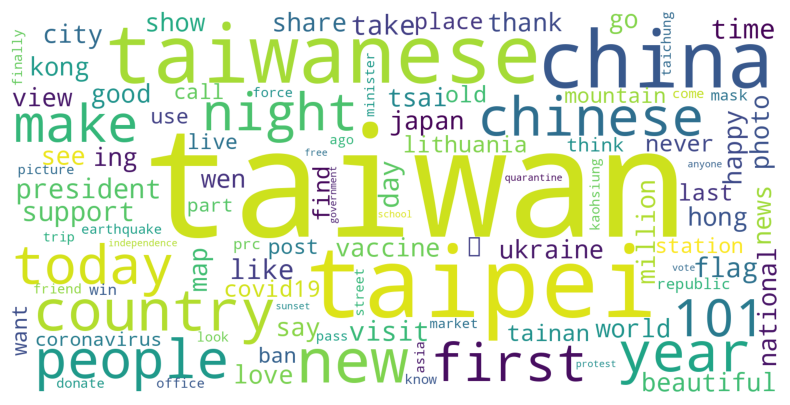

In [ ]:
# draw word cloud for posts
text_post = freq_post.set_index('word').to_dict()
wordcloud_post = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_post['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_post)
plt.axis('off')
plt.show()

We cann see from this picture. That most frequent topic people talk might be about 'taiwan', 'china', 'people', '101', 'chinese'.

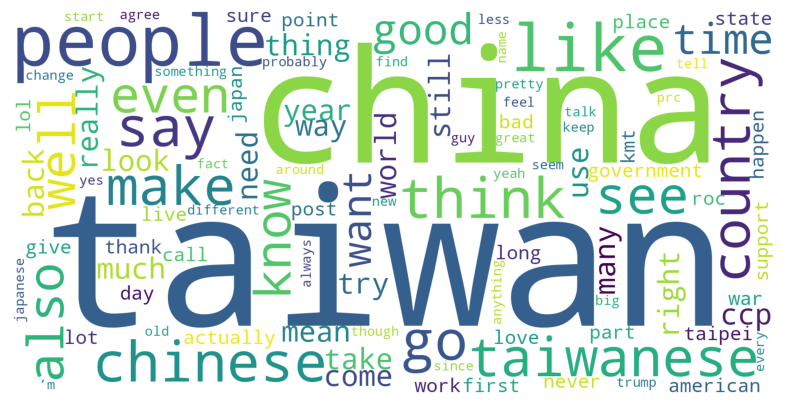

In [ ]:
# draw word cloud for replies
text_reply = freq_reply.set_index('word').to_dict()
text_reply
wordcloud_reply = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_reply['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_reply)
plt.axis('off')
plt.show()

As reply posts, also we can see they talk about 'taiwan', 'china', 'like'.
So we can get the conclusion that people talk about Taiwan with China mostly.
And also they think people in taiwan are kind and good.

### Classified by post_class

First we should trans no_stopword_post into classed_post and no_stopword_reply into classed_reply


In [ ]:
no_stopword_post

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
1,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,stabilizer
2,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,ball
4,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,work
5,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,,JaKha,2967,2021/07/31 12:53:25,taiwan
...,...,...,...,...,...,...,...,...
13129,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,test
13130,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,kit
13132,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,czech
13133,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,republic


To avoid duplicates topic, we shall drop it and count the top 5 in classes.

In [ ]:
# drop_duplicates
no_duplicates_post = no_stopword_post.drop_duplicates(subset='post_id')
no_duplicates_post

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
5,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,,JaKha,2967,2021/07/31 12:53:25,taiwan
18,It seemed relevant....,fydp2i,Entertainment,,mr-wiener,2696,2020/04/10 10:48:16,seem
21,Happy National Day to Taiwan!,q4obqj,NaN,,The_Uptowner,2482,2021/10/09 16:10:00,happy
27,Taipei 101 showing support towards Ukraine,t1ufe0,News,,QuantumLingLing,2399,2022/02/26 10:50:43,taipei
...,...,...,...,...,...,...,...,...
13075,I’m doing a flag project for school and I deci...,ldq5tb,NaN,,lizardbreath62284,428,2021/02/06 04:48:55,’m
13093,Why y'all so bad at driving?,1ceyemi,Video,,caffcaff_,428,2024/04/28 05:05:06,bad
13097,Twitter lies again from CCP. PRC's permanent r...,toezcp,NaN,,Educational_Machine,428,2022/03/26 02:34:34,twitter
13124,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,taiwan


We take the 5 topics with the highest total score for analysis; those topics are more likely to have more posts and more discussions.

In [ ]:
import numpy as np

# Replace 'post_score' values of '' and 'N/A' with 0
no_duplicates_post['post_score'] = no_duplicates_post['post_score'].replace(['', 'N/A'], 0)

# Convert 'post_score' column to integer type
no_duplicates_post['post_score'] = no_duplicates_post['post_score'].astype(np.int64)

<ipython-input-43-a8a033873afb>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_duplicates_post['post_score'] = no_duplicates_post['post_score'].replace(['', 'N/A'], 0)
<ipython-input-43-a8a033873afb>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_duplicates_post['post_score'] = no_duplicates_post['post_score'].astype(np.int64)


In [ ]:
# 依照 'post_class' 分組並加總 'post_score'
grouped_post_score = no_duplicates_post.groupby('post_class')['post_score'].sum()

# 將結果轉換為 DataFrame 並按照 'post_score' 排序
grouped_post_score = grouped_post_score.sort_values(ascending=False).reset_index()

# 取出前五名的 'post_class'
top_5_post_class = grouped_post_score.head(5)

# 輸出結果
top_5_post_class

,post_class,post_score
0,Image,230381
1,News,70889
2,Politics,59406
3,Interesting,50419
4,Discussion,31103


Chosen topics is as shown: Image, News, Politics, Interesting and Discussion.

In [ ]:
no_stopword_reply

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
3,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
4,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,chance
6,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,see
8,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,imagine
13,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27,see
...,...,...,...,...,...,...,...,...,...
2192393,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,tie
2192394,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,fighter
2192399,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,escape
2192400,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,captivity


Retrieve replies to those 5 topics.

In [ ]:
top_5_classes = top_5_post_class['post_class'].head(5).tolist()
top_5_classes

['Image', 'News', 'Politics', 'Interesting', 'Discussion']

In [ ]:
top_5_no_stopword_reply = no_stopword_reply[no_stopword_reply['post_class'].isin(top_5_classes)]
top_5_no_stopword_reply

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
3,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
4,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,chance
6,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,see
8,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,imagine
13,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27,see
...,...,...,...,...,...,...,...,...,...
2192255,Politics,k9m1qa,Exastiken,I should probably say pilsner pilsner pilsner ...,gf9ok4x,2020/12/10 11:40:05,1.0,PlutiPlus,herbal
2192256,Politics,k9m1qa,Exastiken,I should probably say pilsner pilsner pilsner ...,gf9ok4x,2020/12/10 11:40:05,1.0,PlutiPlus,infuse
2192257,Politics,k9m1qa,Exastiken,I should probably say pilsner pilsner pilsner ...,gf9ok4x,2020/12/10 11:40:05,1.0,PlutiPlus,liquid
2192259,Politics,k9m1qa,Exastiken,I should probably say pilsner pilsner pilsner ...,gf9ok4x,2020/12/10 11:40:05,1.0,PlutiPlus,cure


In [ ]:
grouped_reply = top_5_no_stopword_reply.groupby('post_class')

dfs_reply = {}
for name, group in grouped_reply:
    dfs_reply[name] = group

data = {'Key': list(dfs_reply.keys()), 'Count': [len(dfs_reply[key]) for key in dfs_reply.keys()]}
df_counts_reply = pd.DataFrame(data).sort_values(by='Count', ascending=False)
df_counts_reply

,Key,Count
1,Image,180538
4,Politics,176436
0,Discussion,148883
3,News,145309
2,Interesting,59748


We get the number of replies in the top 5 topics.

Draw wordclouds for the five topics to better understand the discussion for each topic

#### Image

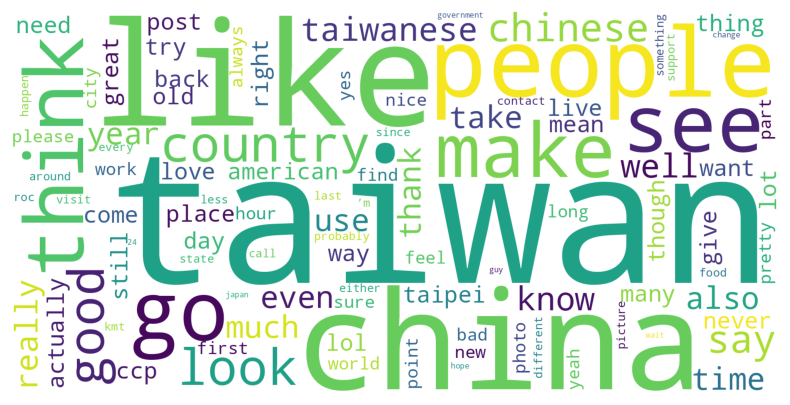

In [ ]:
Discussion_reply = top_5_no_stopword_reply[top_5_no_stopword_reply['post_class'] == 'Image']

freq_Discussion = pd.DataFrame(Discussion_reply['word'].value_counts()).reset_index()
freq_Discussion.columns = ['word', 'freq']

text_post = freq_Discussion.set_index('word').to_dict()
wordcloud_post = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_post['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_post)
plt.axis('off')
plt.show()

#### Politics

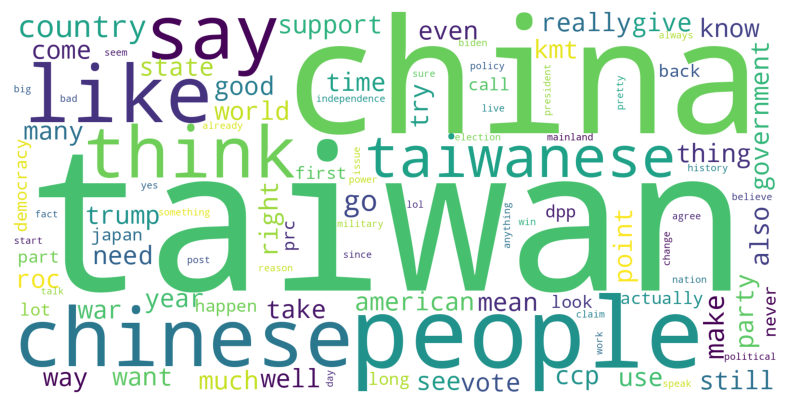

In [ ]:
Discussion_News = top_5_no_stopword_reply[top_5_no_stopword_reply['post_class'] == 'Politics']

freq_News = pd.DataFrame(Discussion_News['word'].value_counts()).reset_index()
freq_News.columns = ['word', 'freq']

text_post = freq_News.set_index('word').to_dict()
wordcloud_post = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_post['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_post)
plt.axis('off')
plt.show()

#### Discussion

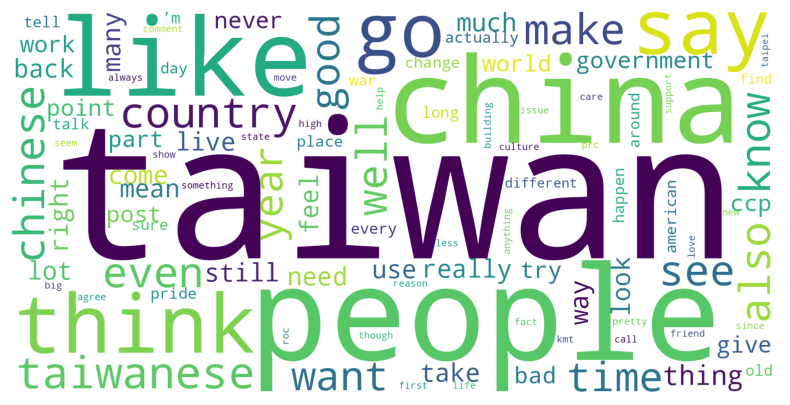

In [ ]:
Discussion_OffTopic = top_5_no_stopword_reply[top_5_no_stopword_reply['post_class'] == 'Discussion']

freq_OffTopic = pd.DataFrame(Discussion_OffTopic['word'].value_counts()).reset_index()
freq_OffTopic.columns = ['word', 'freq']

text_post = freq_OffTopic.set_index('word').to_dict()
wordcloud_post = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_post['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_post)
plt.axis('off')
plt.show()

#### News

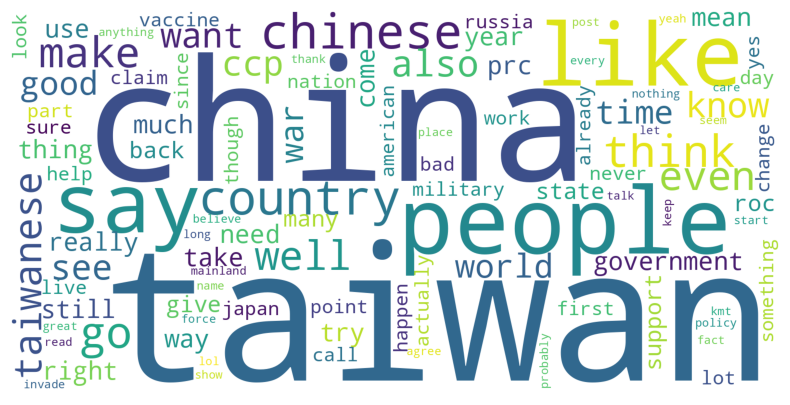

In [ ]:
Discussion_Travel = top_5_no_stopword_reply[top_5_no_stopword_reply['post_class'] == 'News']

freq_Travel = pd.DataFrame(Discussion_Travel['word'].value_counts()).reset_index()
freq_Travel.columns = ['word', 'freq']

text_post = freq_Travel.set_index('word').to_dict()
wordcloud_post = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_post['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_post)
plt.axis('off')
plt.show()

#### Interesting

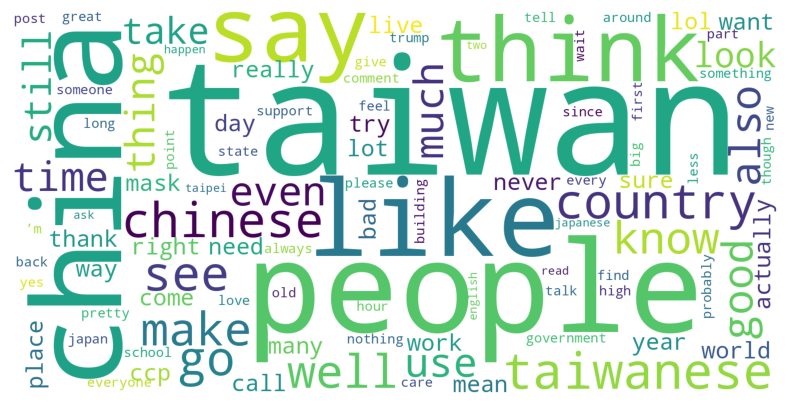

In [ ]:
Discussion_Events = top_5_no_stopword_reply[top_5_no_stopword_reply['post_class'] == 'Interesting']

freq_Events = pd.DataFrame(Discussion_Events['word'].value_counts()).reset_index()
freq_Events.columns = ['word', 'freq']

text_post = freq_Events.set_index('word').to_dict()
wordcloud_post = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text_post['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_post)
plt.axis('off')
plt.show()

We can see the top five class replies above. It seems even Image topic also talks about china.
<br />
We can get that people REALLY care about the relationship between Taiwan and China.
<br />
So maybe can talk about the politics issue later.

## 4.N-gram

### Bi-gram

In [ ]:
ngram_analysis = no_stopword_reply.groupby(['post_id', 'reply', 'post_class'])['word'].apply(list).reset_index()
ngram_analysis

,post_id,reply,post_class,word
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]"
1,1008ecm,Ah yes the negotiator,Image,"[ah, yes, negotiator]"
2,1008ecm,All yt news outlets are the same 💀💀,Image,"[yt, news, outlet, 💀, 💀]"
3,1008ecm,Amazing So was the fireworks,Image,"[amazing, firework]"
4,1008ecm,And it could have maybe kinda been The KMT had...,Image,"[maybe, kinda, kmt, option, retreat, place, ma..."
...,...,...,...,...
53582,zzzuhu,They didnt just pick it Taipei 101 is the very...,Image,"[pick, taipei, 101, reason, sub, exist, lol]"
53583,zzzuhu,This might be just about the only flattering s...,Image,"[flattering, shot, year, firework, display, fe..."
53584,zzzuhu,While its now 2023 my brain is still stuck in ...,Image,"[2023, brain, still, stick, 2020]"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj..."


In [ ]:
from itertools import tee

In [ ]:
def generate_bigrams(words):
    a, b = tee(words)
    next(b, None)
    return list(zip(a, b))

In [ ]:
bigram_analysis = ngram_analysis.copy()
bigram_analysis['bi_grams'] = bigram_analysis['word'].apply(generate_bigrams)
bigram_analysis

,post_id,reply,post_class,word,bi_grams
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","[(right, cnn), (cnn, lie), (lie, everyone), (e..."
1,1008ecm,Ah yes the negotiator,Image,"[ah, yes, negotiator]","[(ah, yes), (yes, negotiator)]"
2,1008ecm,All yt news outlets are the same 💀💀,Image,"[yt, news, outlet, 💀, 💀]","[(yt, news), (news, outlet), (outlet, 💀), (💀, 💀)]"
3,1008ecm,Amazing So was the fireworks,Image,"[amazing, firework]","[(amazing, firework)]"
4,1008ecm,And it could have maybe kinda been The KMT had...,Image,"[maybe, kinda, kmt, option, retreat, place, ma...","[(maybe, kinda), (kinda, kmt), (kmt, option), ..."
...,...,...,...,...,...
53582,zzzuhu,They didnt just pick it Taipei 101 is the very...,Image,"[pick, taipei, 101, reason, sub, exist, lol]","[(pick, taipei), (taipei, 101), (101, reason),..."
53583,zzzuhu,This might be just about the only flattering s...,Image,"[flattering, shot, year, firework, display, fe...","[(flattering, shot), (shot, year), (year, fire..."
53584,zzzuhu,While its now 2023 my brain is still stuck in ...,Image,"[2023, brain, still, stick, 2020]","[(2023, brain), (brain, still), (still, stick)..."
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","[(hand, evilbuilding), (evilbuilding, subreddi..."


In [ ]:
bigram_analysis = bigram_analysis.explode('bi_grams')
bigram_analysis

,post_id,reply,post_class,word,bi_grams
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(right, cnn)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(cnn, lie)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(lie, everyone)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(everyone, 😂)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(😂, 😂)"
...,...,...,...,...,...
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(101, major)"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(major, example)"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(example, villainous)"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(villainous, building)"


In [ ]:
# Calculate the occurrence of each combination
bigram_analysis = bigram_analysis.groupby(["bi_grams"],as_index=False).size()
bigram_analysis.sort_values(by=['size'], ascending=False).head(15)

,bi_grams,size
224798,"(hong, kong)",691
7356,"(24, hour)",613
283085,"(look, like)",604
108577,"(contact, moderator)",592
475461,"(taiwanese, people)",562
401051,"(republic, china)",557
547828,"(year, ago)",454
343600,"(part, china)",393
203221,"(gon, na)",389
178071,"(feel, like)",389


In [ ]:
import networkx as nx
import plotly.graph_objs as go
from plotly.offline import plot
import IPython

In [ ]:
# Take top 30 of those bigrams
top_30_bigrams = bigram_analysis.nlargest(30, 'size')

# Create an empty graph
G = nx.Graph()

# Add weight
for index, row in top_30_bigrams.iterrows():
    bi_gram = row['bi_grams']
    count = row['size']
    G.add_edge(bi_gram[0], bi_gram[1], weight=count/100)

# Set layout
pos = nx.spring_layout(G, dim=3)

# Retrieve node location
node_x = []
node_y = []
node_z = []
node_text = []

for node in G.nodes():
    x, y, z = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(z)
    node_text.append(node)

# Retrieve edge location
edge_x = []
edge_y = []
edge_z = []

for edge in G.edges():
    x0, y0, z0 = pos[edge[0]]
    x1, y1, z1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_z.extend([z0, z1, None])

# Draw edges
edge_trace = go.Scatter3d(
    x=edge_x, y=edge_y, z=edge_z,
    line=dict(width=0.5, color='grey'),
    hoverinfo='none',
    mode='lines')

# Draw nodes
node_trace = go.Scatter3d(
    x=node_x, y=node_y, z=node_z,
    mode='markers+text',
    text=node_text,
    textposition='top center',
    hoverinfo='text',
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        color='purple',
        size=10,
        line=dict(width=2)))

# create chart
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='3D Network Graph',
                    showlegend=False,
                    margin=dict(b=0, l=0, r=0, t=0),
                    scene=dict(
                        xaxis=dict(showbackground=False),
                        yaxis=dict(showbackground=False),
                        zaxis=dict(showbackground=False)
                    )))

# plot HTML
plot(fig, filename='3d_network_graph_bigram.html')

# display HTML
IPython.display.HTML('3d_network_graph_bigram.html')

Taiwan and China is also closely discussed.
From the bi-gram, we can see the following:
- 'Hong Kong' is mentioned a lot
- '24' and 'hour' has a close relationship, may be the discussion about convenient Taiwanese services, such as convenience stores, or the TSMC
- 'contact' and 'moderator' is also a commonly occurring combination; this may occur in discussions where people are violating rules and moderators need to be contacted, or the fact that most Taiwanese discussions are heavily moderated in Chinese forums
- 'Taiwan' and 'China' is also very closely discussed.

### tri-gram

In [ ]:
def generate_trigrams(words):
    a, b, c = tee(words, 3)
    next(b, None)
    next(c, None)
    next(c, None)
    return list(zip(a, b, c))

In [ ]:
trigram_analysis = ngram_analysis.copy()
trigram_analysis['tri_grams'] = trigram_analysis['word'].apply(generate_trigrams)
trigram_analysis

,post_id,reply,post_class,word,tri_grams
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","[(right, cnn, lie), (cnn, lie, everyone), (lie..."
1,1008ecm,Ah yes the negotiator,Image,"[ah, yes, negotiator]","[(ah, yes, negotiator)]"
2,1008ecm,All yt news outlets are the same 💀💀,Image,"[yt, news, outlet, 💀, 💀]","[(yt, news, outlet), (news, outlet, 💀), (outle..."
3,1008ecm,Amazing So was the fireworks,Image,"[amazing, firework]",[]
4,1008ecm,And it could have maybe kinda been The KMT had...,Image,"[maybe, kinda, kmt, option, retreat, place, ma...","[(maybe, kinda, kmt), (kinda, kmt, option), (k..."
...,...,...,...,...,...
53582,zzzuhu,They didnt just pick it Taipei 101 is the very...,Image,"[pick, taipei, 101, reason, sub, exist, lol]","[(pick, taipei, 101), (taipei, 101, reason), (..."
53583,zzzuhu,This might be just about the only flattering s...,Image,"[flattering, shot, year, firework, display, fe...","[(flattering, shot, year), (shot, year, firewo..."
53584,zzzuhu,While its now 2023 my brain is still stuck in ...,Image,"[2023, brain, still, stick, 2020]","[(2023, brain, still), (brain, still, stick), ..."
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","[(hand, evilbuilding, subreddit), (evilbuildin..."


In [ ]:
trigram_analysis = trigram_analysis.explode('tri_grams')
trigram_analysis

,post_id,reply,post_class,word,tri_grams
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(right, cnn, lie)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(cnn, lie, everyone)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(lie, everyone, 😂)"
0,1008ecm,About right for CNN They lie to everyone 😂😂,Image,"[right, cnn, lie, everyone, 😂, 😂]","(everyone, 😂, 😂)"
1,1008ecm,Ah yes the negotiator,Image,"[ah, yes, negotiator]","(ah, yes, negotiator)"
...,...,...,...,...,...
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(pick, 101, major)"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(101, major, example)"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(major, example, villainous)"
53585,zzzuhu,While on the other hand evilbuildings subreddi...,Image,"[hand, evilbuilding, subreddit, pick, 101, maj...","(example, villainous, building)"


In [ ]:
# Calculate the occurrence of every combination
trigram_analysis = trigram_analysis.groupby(["tri_grams"],as_index=False).size()
trigram_analysis.sort_values(by=['size'], ascending=False).head(15)

,tri_grams,size
87304,"(bot, action, perform)",298
20586,"(action, perform, automatically)",298
371179,"(less, 24, hour)",298
63739,"(automatically, please, contact)",296
151559,"(contact, moderator, approval)",296
749012,"(wait, 24, hour)",296
314554,"(hour, resubmit, post)",296
151560,"(contact, moderator, subredditmessagecomposeto...",296
52542,"(approval, thank, bot)",296
431837,"(moderator, subredditmessagecomposetortaiwan, ...",296


In [ ]:
# take the top 30 occurring combinations
top_30_trigrams = trigram_analysis.nlargest(30, 'size')

# create an empty NetworkX graph
G = nx.Graph()

# add weight
for index, row in top_30_trigrams.iterrows():
    tri_gram = row['tri_grams']
    count = row['size']
    # add edges
    G.add_edge(tri_gram[0], tri_gram[1], weight=count/100)
    G.add_edge(tri_gram[1], tri_gram[2], weight=count/100)
    G.add_edge(tri_gram[0], tri_gram[2], weight=count/100)

# set node locations
pos = nx.spring_layout(G, dim=3)

# get node locations
node_x = []
node_y = []
node_z = []
node_text = []

for node in G.nodes():
    x, y, z = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(z)
    node_text.append(node)

# get edge locations
edge_x = []
edge_y = []
edge_z = []

for edge in G.edges():
    x0, y0, z0 = pos[edge[0]]
    x1, y1, z1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_z.extend([z0, z1, None])

# plot edge
edge_trace = go.Scatter3d(
    x=edge_x, y=edge_y, z=edge_z,
    line=dict(width=0.5, color='grey'),
    hoverinfo='none',
    mode='lines')

# plot nodes
node_trace = go.Scatter3d(
    x=node_x, y=node_y, z=node_z,
    mode='markers+text',
    text=node_text,
    textposition='top center',
    hoverinfo='text',
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        color='purple',
        size=10,
        line=dict(width=2)))

# create the graph
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='3D Network Graph',
                    showlegend=False,
                    margin=dict(b=0, l=0, r=0, t=0),
                    scene=dict(
                        xaxis=dict(showbackground=False),
                        yaxis=dict(showbackground=False),
                        zaxis=dict(showbackground=False)
                    )))

# plot HTML
plot(fig, filename='3d_network_graph_trigram.html')
IPython.display.HTML('3d_network_graph_trigram.html')

From this chart we may deduce that TSMC is discussed a lot:
- bot, action, perform
- action, perform, automatically
- 24, hour, old

Furthermore, 'Taiwan' and 'China' are often mentioned together, but not in relation with other topics.

## 5.Save to CSV

In [ ]:
no_stopword_post.to_csv('no_stopword_post.csv', index=False)
no_stopword_reply.to_csv('no_stopword_reply.csv', index=False)

## 6.LLM

### Need to restart core

From every single analysis above, we can see that the issue between Taiwan and China is the most discussed in all topics. Thus we will continue down the discussion of politics, and analyze using LLM.
Utilizing the few-shot strategy, we will have LLM to determine the political position of every reply, to see if public opinion changes over time.

In [ ]:
import os

from google.colab import drive
drive.mount('/content/drive')

# os.chdir('/content/drive/MyDrive/Colab Notebooks/SMA_FinalProject/') #切換該目錄
os.chdir('/content/drive/MyDrive/Colab Notebooks/project/') #切換該目錄
os.listdir() #確認目錄內容

Mounted at /content/drive


['Reddit_Taiwan_Classed_new.csv',
 '3d_network_graph_bigram.html',
 '3d_network_graph_trigram.html',
 'no_stopword_reply.csv',
 'no_stopword_post.csv',
 'tranData',
 'combined_reply_LLM.csv']

In [ ]:
import pandas as pd

In [ ]:
load_no_stopword_post = pd.read_csv('no_stopword_post.csv')
load_no_stopword_post

,title,post_id,post_class,post,author,post_score,post_time,word
0,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,101
1,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,stabilizer
2,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,ball
3,101 stabilizer ball at work,xhi5a5,Interesting,,Unlikely-Os,3881,2022/09/18 14:29:35,work
4,Taiwan Defeats China in Men's Doubles Badminto...,ov6mir,Olympics,,JaKha,2967,2021/07/31 12:53:25,taiwan
...,...,...,...,...,...,...,...,...
7450,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,test
7451,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,kit
7452,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,czech
7453,Taiwan firm donates COVID-19 rapid test kits t...,k9m1qa,Politics,,Exastiken,427,2020/12/09 05:41:02,republic


In [ ]:
import csv

with open('no_stopword_reply.csv', 'r', encoding='utf-8') as file:
    reader = csv.reader(file, delimiter=',', quotechar='"')
    load_no_stopword_reply = []
    for row in reader:
        load_no_stopword_reply.append(row)

# Convert the list of rows into a DataFrame
load_no_stopword_reply = pd.DataFrame(load_no_stopword_reply)

load_no_stopword_reply.columns = load_no_stopword_reply.iloc[0]
# Drop the first row since it is now used as column names
load_no_stopword_reply = load_no_stopword_reply.iloc[1:]

load_no_stopword_reply

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
1,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
2,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,chance
3,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,see
4,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,imagine
5,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27,see
...,...,...,...,...,...,...,...,...,...
1073783,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,tie
1073784,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,fighter
1073785,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,escape
1073786,Entertainment,qcfu4p,JunYou-,There have been instances when rebels have com...,hhijtgl,2021/10/21 17:30:29,2.0,TChen114,captivity


### drop duplicates replies

In [ ]:
# drop_duplicates
no_duplicates_reply = load_no_stopword_reply.drop_duplicates(subset='reply_id')
no_duplicates_reply

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word
1,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime
5,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27,see
16,Interesting,xhi5a5,Unlikely-Os,I would LOVE to see this up close Its amazing ...,ioy2mnx,2022/09/18 16:43:13,78.0,LoudDrawing4085,love
21,Interesting,xhi5a5,Unlikely-Os,FYI This isn’t my video found it on Facebook g...,ioyism3,2022/09/18 18:23:27,73.0,Unlikely-Os,fyi
67,Interesting,xhi5a5,Unlikely-Os,Why aren’t you afraid of earthquakes Big Balls,ioyf0ne,2022/09/18 18:00:48,35.0,dis_not_my_name,afraid
...,...,...,...,...,...,...,...,...,...
1073754,Entertainment,qcfu4p,JunYou-,i legit dont know about star wars idk,hhgso9g,2021/10/21 07:38:55,8.0,JunYou-,legit
1073759,Entertainment,qcfu4p,JunYou-,That was the old model The new KMTie Figters ...,hhh09zp,2021/10/21 09:37:01,14.0,ShrimpCrackers,old
1073767,Entertainment,qcfu4p,JunYou-,Welp just so you know this fighter is used by ...,hhgu0he,2021/10/21 07:59:18,3.0,mr-wiener,welp
1073774,Entertainment,qcfu4p,JunYou-,hrmm maybe you need to watch ill get you started,hhjwzz3,2021/10/21 23:14:51,1.0,katsudon-jpz,hrmm


### Generate LLM column

Start to train promt.

In [ ]:
!pip install openai==0.28

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 2.5 MB/s eta 0:00:00


### Special thanks to EMLiu to lend accout to us to use paid OpenAPI playground

In [26]:
import pandas as pd
import openai

# Set API key
openai.api_key = 'Your API Key'

In [27]:
# Define few-shot example template
fewshot_template = """You are a social media analyst. Based on the examples below, identify the political stance of the question as either: Independent, Unite, or Neural.

Examples:
Question: The historical and cultural ties between Taiwan and China are undeniable, and a unified China would ensure a stronger and more prosperous future for all Chinese people.
Answer: Unite

Question: A peaceful and negotiated reunification of Taiwan and China is in the best interest of regional stability and global peace, fostering cooperation and mutual development.
Answer: Unite

Question: The principle of one China is central to the nation's identity and unity; reunification with Taiwan is a historical necessity that will strengthen China's position on the global stage.
Answer: Unite

Question: An independent Taiwan can contribute significantly to regional stability and global progress by maintaining its distinct political and economic systems.
Answer: Independent

Question: Taiwan's achievements in human rights, technological innovation, and economic development are testament to its capability and right to exist as an independent nation.
Answer: Independent

Question: The preservation of Taiwan's autonomy and democratic values is crucial, and its pursuit of independence is a legitimate aspiration supported by its people and the international community.
Answer: Independent

Question: The future relationship between China and Taiwan should be determined peacefully through dialogue and mutual understanding, respecting the aspirations of the people on both sides.
Answer: Neural

Question: It is important for all parties to engage in constructive communication to ensure regional stability and prosperity, while respecting historical and cultural ties.
Answer: Neural

Question: The complex relationship between China and Taiwan requires careful consideration of both nations' perspectives, aiming for a solution that promotes peace and mutual benefit.
Answer: Neural

Now, please answer the following question:
Question: {question}
Answer:"""



In [28]:
import time

# Define the function to get judgement with retry mechanism
def get_judgement(question, retries=5, delay=5):
    for attempt in range(retries):
        try:
            prompt = fewshot_template.format(question=question)
            response = openai.ChatCompletion.create(
                model="gpt-3.5-turbo",
                messages=[
                    {"role": "user", "content": prompt}
                ],
                max_tokens=10,
                temperature=0
            )
            answer = response['choices'][0]['message']['content'].strip()
            return answer
        except openai.error.RateLimitError as e:
            print(f"Rate limit error: {e}. Retrying in {delay} seconds...")
            time.sleep(delay)
            delay *= 2  # Exponential backoff
        except Exception as e:
            print(f"Error: {e}.")
            return None
    print("Max retries reached.")
    return None

# Define the function to process data in batches and generate a new column
def process_in_batches(dataframe, batch_size=50, delay=1):
    results = []
    for i in range(0, len(dataframe), batch_size):
        batch = dataframe.iloc[i:i + batch_size]
        batch_results = batch['reply'].apply(lambda x: get_judgement(x))
        results.extend(batch_results)
        print(f"Processed batch {i // batch_size + 1}/{(len(dataframe) + batch_size - 1) // batch_size}")
        time.sleep(delay)  # Delay for the specified seconds after each batch
    return results

In [29]:
# Function to split the dataframe into chunks of a specified size
def split_dataframe(dataframe, chunk_size=1000):
    return [dataframe[i:i + chunk_size] for i in range(0, len(dataframe), chunk_size)]

# Function to process and save each dataframe chunk
def process_and_save_batches(dataframe_list, delay=1):
    if not os.path.exists('tranData'):
        os.makedirs('tranData')

    for idx, df in enumerate(dataframe_list):
        try:
            df['LLM_judge'] = process_in_batches(df, delay=delay)
            # change the number of batch to avoid replacing of previous files.
            filename = f'tranData/batch_{idx + 51}.csv'
            df.to_csv(filename, index=False)
            print(f"Processed and saved {filename}")
        except Exception as e:
            print(f"Error processing batch {idx + 51}: {e}")
            continue

In [30]:
# Split the dataset
dataframe_list = split_dataframe(no_duplicates_reply, chunk_size=1000)
# the first 50 set is finished.
# start from the 51st one
# dataframe_list = dataframe_list[40:50]
dataframe_list = dataframe_list[50:]
len(dataframe_list)

10

In [31]:
# Process and save each dataframe chunk
# remember delay set 2 next run
process_and_save_batches(dataframe_list, delay=2)

Processed batch 1/20
Processed batch 2/20
Processed batch 3/20
Processed batch 4/20
Processed batch 5/20
Processed batch 6/20
Processed batch 7/20
Processed batch 8/20
Processed batch 9/20
Processed batch 10/20
Processed batch 11/20
Processed batch 12/20
Processed batch 13/20
Processed batch 14/20
Processed batch 15/20
Processed batch 16/20
Processed batch 17/20
Processed batch 18/20
Processed batch 19/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59483, Requested 545. Please try again in 28ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 20/20


<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_51.csv
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59471, Requested 552. Please try again in 23ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 1/20
Processed batch 2/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59477, Requested 595. Please try again in 72ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 3/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59506, Requested 612. Please try again in 117ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 4/20
Processed batch

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_52.csv
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59576, Requested 555. Please try again in 131ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 1/20
Processed batch 2/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59615, Requested 752. Please try again in 367ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 3/20
Processed batch 4/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59343, Requested 661. Please try again in 4ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_53.csv
Processed batch 1/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59553, Requested 536. Please try again in 89ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 2/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59538, Requested 534. Please try again in 72ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 3/20
Processed batch 4/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59566, Requested 538. Please try again in 104ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_54.csv
Processed batch 1/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59632, Requested 559. Please try again in 191ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 2/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59428, Requested 596. Please try again in 24ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 3/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59512, Requested 527. Please try again in 39ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 4/20
Processed batch

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_55.csv
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59655, Requested 530. Please try again in 185ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 1/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59512, Requested 526. Please try again in 38ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 2/20
Processed batch 3/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59492, Requested 542. Please try again in 34ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 4/20
Rate limit erro

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_56.csv
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59486, Requested 649. Please try again in 135ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 1/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59526, Requested 584. Please try again in 110ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 2/20
Processed batch 3/20
Processed batch 4/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59527, Requested 602. Please try again in 129ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed bat

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_57.csv
Processed batch 1/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59473, Requested 543. Please try again in 16ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 2/20
Processed batch 3/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59486, Requested 532. Please try again in 18ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 4/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59502, Requested 526. Please try again in 28ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_58.csv
Processed batch 1/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59510, Requested 556. Please try again in 66ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 2/20
Processed batch 3/20
Processed batch 4/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59631, Requested 528. Please try again in 159ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 5/20
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59581, Requested 528. Please try again in 109ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seco

<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Processed and saved tranData/batch_59.csv
Rate limit error: Rate limit reached for gpt-3.5-turbo in organization org-HE38L7x1IpRIZZXzaeRgIOjR on tokens per min (TPM): Limit 60000, Used 59447, Requested 566. Please try again in 13ms. Visit https://platform.openai.com/account/rate-limits to learn more.. Retrying in 5 seconds...
Processed batch 1/3
Processed batch 2/3
Processed batch 3/3
Processed and saved tranData/batch_60.csv


<ipython-input-29-05da6d785bfd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LLM_judge'] = process_in_batches(df, delay=delay)


Notice that OpenAI T1 stage has some limit of TPM and RPD, I suggest delay should bigger then 2s, and split the file into 1000 rows for each.
<br />
After finishing one file then save it.

### Combine sub-sets

To Avoid from LLM generate fail. We split the data set into 60 sub-set.
<br />
Now we need to combine the sub-set into one set.

In [32]:
# Define the expected columns
expected_columns = ['post_class', 'post_id', 'author', 'reply', 'reply_id', 'reply_time', 'reply_score', 'reply_Author', 'word', 'LLM_judge']

# Define the data types for all columns as string
dtypes = {col: str for col in expected_columns}

# Create an empty DataFrame with the expected columns
combined_df = pd.DataFrame(columns=expected_columns)

# Use a for loop to read and combine files
for i in range(1, 61):
    file_name = f'./tranData/batch_{i}.csv'  # Construct the file name
    df = pd.read_csv(file_name, dtype=dtypes)  # Read the current CSV file with specified data types

    # Check if the columns match the expected columns
    if list(df.columns) != expected_columns:
        print(f'Columns in {file_name} do not match expected columns')
        continue  # Skip this file if columns do not match

    combined_df = pd.concat([combined_df, df], ignore_index=True)  # Append to the combined DataFrame

# Save the combined DataFrame to a new CSV file
output_file = 'combined_reply_LLM.csv'
combined_df.to_csv(output_file, index=False)


### Load from .CSV

In [1]:
# Uncomment the following if you're starting here

import os
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

# os.chdir('/content/drive/MyDrive/Colab Notebooks/SMA_FinalProject/') #切換該目錄
os.chdir('/content/drive/MyDrive/Colab Notebooks/project/') #切換該目錄
os.listdir() #確認目錄內容

Mounted at /content/drive


['Reddit_Taiwan_Classed_new.csv',
 '3d_network_graph_bigram.html',
 '3d_network_graph_trigram.html',
 'no_stopword_reply.csv',
 'no_stopword_post.csv',
 'tranData',
 'combined_reply_LLM.csv']

In [21]:
# load csv
load_no_duplicates_reply_LLM = pd.read_csv('combined_reply_LLM.csv')
load_no_duplicates_reply_LLM

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word,LLM_judge
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022/09/18 16:30:11,156.0,Mobile-Ad3695,lifetime,Neural
1,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022/09/18 14:34:42,233.0,kailin27,see,Neural
2,Interesting,xhi5a5,Unlikely-Os,I would LOVE to see this up close Its amazing ...,ioy2mnx,2022/09/18 16:43:13,78.0,LoudDrawing4085,love,Neural
3,Interesting,xhi5a5,Unlikely-Os,FYI This isn’t my video found it on Facebook g...,ioyism3,2022/09/18 18:23:27,73.0,Unlikely-Os,fyi,Neutral
4,Interesting,xhi5a5,Unlikely-Os,Why aren’t you afraid of earthquakes Big Balls,ioyf0ne,2022/09/18 18:00:48,35.0,dis_not_my_name,afraid,Neural
...,...,...,...,...,...,...,...,...,...,...
59120,Entertainment,qcfu4p,JunYou-,i legit dont know about star wars idk,hhgso9g,2021/10/21 07:38:55,8.0,JunYou-,legit,Neural
59121,Entertainment,qcfu4p,JunYou-,That was the old model The new KMTie Figters ...,hhh09zp,2021/10/21 09:37:01,14.0,ShrimpCrackers,old,Independent
59122,Entertainment,qcfu4p,JunYou-,Welp just so you know this fighter is used by ...,hhgu0he,2021/10/21 07:59:18,3.0,mr-wiener,welp,Neural
59123,Entertainment,qcfu4p,JunYou-,hrmm maybe you need to watch ill get you started,hhjwzz3,2021/10/21 23:14:51,1.0,katsudon-jpz,hrmm,Neural


In [23]:
# Convert 'reply_time' to datetime format
load_no_duplicates_reply_LLM['reply_time'] = pd.to_datetime(load_no_duplicates_reply_LLM['reply_time'], errors='coerce')
load_no_duplicates_reply_LLM

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word,LLM_judge
0,Interesting,xhi5a5,Unlikely-Os,Once in a lifetime chance to see that Imagine ...,ioy0mve,2022-09-18 16:30:11,156.0,Mobile-Ad3695,lifetime,Neural
1,Interesting,xhi5a5,Unlikely-Os,Ive seen the thing in person and its so huge I...,ioxjexn,2022-09-18 14:34:42,233.0,kailin27,see,Neural
2,Interesting,xhi5a5,Unlikely-Os,I would LOVE to see this up close Its amazing ...,ioy2mnx,2022-09-18 16:43:13,78.0,LoudDrawing4085,love,Neural
3,Interesting,xhi5a5,Unlikely-Os,FYI This isn’t my video found it on Facebook g...,ioyism3,2022-09-18 18:23:27,73.0,Unlikely-Os,fyi,Neutral
4,Interesting,xhi5a5,Unlikely-Os,Why aren’t you afraid of earthquakes Big Balls,ioyf0ne,2022-09-18 18:00:48,35.0,dis_not_my_name,afraid,Neural
...,...,...,...,...,...,...,...,...,...,...
59120,Entertainment,qcfu4p,JunYou-,i legit dont know about star wars idk,hhgso9g,2021-10-21 07:38:55,8.0,JunYou-,legit,Neural
59121,Entertainment,qcfu4p,JunYou-,That was the old model The new KMTie Figters ...,hhh09zp,2021-10-21 09:37:01,14.0,ShrimpCrackers,old,Independent
59122,Entertainment,qcfu4p,JunYou-,Welp just so you know this fighter is used by ...,hhgu0he,2021-10-21 07:59:18,3.0,mr-wiener,welp,Neural
59123,Entertainment,qcfu4p,JunYou-,hrmm maybe you need to watch ill get you started,hhjwzz3,2021-10-21 23:14:51,1.0,katsudon-jpz,hrmm,Neural


### Adjust errors

In [24]:
# fix typo because it is faster than re-running LLM
load_no_duplicates_reply_LLM['LLM_judge'] = load_no_duplicates_reply_LLM['LLM_judge'].replace({
    'Neural': 'Neutral'
})

In [46]:
grouped_df = load_no_duplicates_reply_LLM.groupby('LLM_judge').size().reset_index(name='count')
grouped_df.sort_values(by='count', ascending=False).head(10)

,LLM_judge,count
22,Neutral,46081
17,Independent,8685
44,Unite,4303
37,This question does not align with any of the p...,5
40,This question does not have a clear political ...,4
36,This question does not align with any of the i...,3
9,"Based on the examples provided, the political ...",2
34,This question contains false and conspiratoria...,1
28,The examples provided suggest a narrative that...,1
29,The issue of Taiwan is simple and straightforw...,1


In [26]:
filtered_grouped_df = load_no_duplicates_reply_LLM[load_no_duplicates_reply_LLM['LLM_judge'].isin(['Independent', 'Neutral', 'Unite'])]
grouped_df = filtered_grouped_df.groupby('LLM_judge').size().reset_index(name='count')
grouped_df

,LLM_judge,count
0,Independent,8685
1,Neutral,46081
2,Unite,4303


We can see that most of the replies is on the Neural position.
<br />
And more replies are in the Independent stance than the other.

In [27]:
# Sort the filtered_grouped_df DataFrame by 'reply_time' in descending order
sorted_grouped_df = filtered_grouped_df.sort_values(by='reply_time', ascending=False)
sorted_grouped_df

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word,LLM_judge
12618,Entertainment,1colmxz,SmoothAmbassador8,Sometimes it’s the vibe that you love …,l4tzuvg,2024-05-20 04:22:01,1.0,askforchange,sometimes,Neutral
35842,Entertainment,1cuu9et,LegendaryMuntjac,lol the TPP independent What they’ve done so f...,l4t5fz6,2024-05-20 00:26:13,0.0,kazenoryu2,lol,Independent
35809,Entertainment,1cuu9et,LegendaryMuntjac,double cheeked up on a wednesday afternoon…,l4rfc5j,2024-05-19 17:34:08,1.0,daj0412,double,Neutral
35828,Entertainment,1cuu9et,LegendaryMuntjac,One of them will get an extended prison stay o...,l4quq8o,2024-05-19 15:26:29,1.0,Semtex1939,extended,Neutral
35808,Entertainment,1cuu9et,LegendaryMuntjac,The exact word for this is melee,l4qkvn0,2024-05-19 14:21:11,1.0,Vivid-Bake2456,exact,Neutral
...,...,...,...,...,...,...,...,...,...,...
44996,America shouldn’t give up Taiwan’s strategic ...,i1j882n,2022/03/21 14:29:35,1.0,Tiger-Billy,NaT,NaN,NaN,NaN,Neutral
50907,New updates about this petition campaign wi...,hdzfne2,2021/09/23 16:54:41,14.0,Natural_Ice_501,NaT,NaN,NaN,NaN,Neutral
50977,If you send medical personnel for first aid...,hyvj2pp,2022/03/01 04:56:24,11.0,q00153,NaT,NaN,NaN,NaN,Neutral
57907,This international treaty sets four criteria ...,h95cmv4,2021/08/16 12:21:21,10.0,taike0886,NaT,NaN,NaN,NaN,Neutral


In [28]:
# Count the number of NaT values in the 'reply_time' column
non_datetime_count = sorted_grouped_df['reply_time'].isna().sum()
non_datetime_count

24

In [29]:
# clear na reply_time left pure data set
Non_NA_time_df  = sorted_grouped_df[sorted_grouped_df['reply_time'].notna()]
Non_NA_time_df

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word,LLM_judge
12618,Entertainment,1colmxz,SmoothAmbassador8,Sometimes it’s the vibe that you love …,l4tzuvg,2024-05-20 04:22:01,1.0,askforchange,sometimes,Neutral
35842,Entertainment,1cuu9et,LegendaryMuntjac,lol the TPP independent What they’ve done so f...,l4t5fz6,2024-05-20 00:26:13,0.0,kazenoryu2,lol,Independent
35809,Entertainment,1cuu9et,LegendaryMuntjac,double cheeked up on a wednesday afternoon…,l4rfc5j,2024-05-19 17:34:08,1.0,daj0412,double,Neutral
35828,Entertainment,1cuu9et,LegendaryMuntjac,One of them will get an extended prison stay o...,l4quq8o,2024-05-19 15:26:29,1.0,Semtex1939,extended,Neutral
35808,Entertainment,1cuu9et,LegendaryMuntjac,The exact word for this is melee,l4qkvn0,2024-05-19 14:21:11,1.0,Vivid-Bake2456,exact,Neutral
...,...,...,...,...,...,...,...,...,...,...
50460,Activism,20q7ka,ddkkz2003,I live about 10 minutes from the Legislative Y...,cg5roel,2014-03-18 17:54:35,5.0,Disorted,live,Neutral
50530,Activism,20q7ka,ddkkz2003,I doubt itll come down to that Taiwanese peopl...,cg5rhgh,2014-03-18 17:48:00,11.0,lolstebbo,doubt,Neutral
50470,Activism,20q7ka,ddkkz2003,wow hopefully Taiwan does not turn into anothe...,cg5rafz,2014-03-18 17:41:02,6.0,unchangingtask,wow,Neutral
50451,Activism,20q7ka,ddkkz2003,To get an idea of which way each English langu...,cg5qaav,2014-03-18 17:05:49,9.0,robotpicnic,idea,Neutral


In [30]:
# get year so that we can group by year later
Non_NA_time_df['reply_year'] = Non_NA_time_df['reply_time'].dt.year
Non_NA_time_df

<ipython-input-30-a3dbfe8f69ba>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Non_NA_time_df['reply_year'] = Non_NA_time_df['reply_time'].dt.year


,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word,LLM_judge,reply_year
12618,Entertainment,1colmxz,SmoothAmbassador8,Sometimes it’s the vibe that you love …,l4tzuvg,2024-05-20 04:22:01,1.0,askforchange,sometimes,Neutral,2024
35842,Entertainment,1cuu9et,LegendaryMuntjac,lol the TPP independent What they’ve done so f...,l4t5fz6,2024-05-20 00:26:13,0.0,kazenoryu2,lol,Independent,2024
35809,Entertainment,1cuu9et,LegendaryMuntjac,double cheeked up on a wednesday afternoon…,l4rfc5j,2024-05-19 17:34:08,1.0,daj0412,double,Neutral,2024
35828,Entertainment,1cuu9et,LegendaryMuntjac,One of them will get an extended prison stay o...,l4quq8o,2024-05-19 15:26:29,1.0,Semtex1939,extended,Neutral,2024
35808,Entertainment,1cuu9et,LegendaryMuntjac,The exact word for this is melee,l4qkvn0,2024-05-19 14:21:11,1.0,Vivid-Bake2456,exact,Neutral,2024
...,...,...,...,...,...,...,...,...,...,...,...
50460,Activism,20q7ka,ddkkz2003,I live about 10 minutes from the Legislative Y...,cg5roel,2014-03-18 17:54:35,5.0,Disorted,live,Neutral,2014
50530,Activism,20q7ka,ddkkz2003,I doubt itll come down to that Taiwanese peopl...,cg5rhgh,2014-03-18 17:48:00,11.0,lolstebbo,doubt,Neutral,2014
50470,Activism,20q7ka,ddkkz2003,wow hopefully Taiwan does not turn into anothe...,cg5rafz,2014-03-18 17:41:02,6.0,unchangingtask,wow,Neutral,2014
50451,Activism,20q7ka,ddkkz2003,To get an idea of which way each English langu...,cg5qaav,2014-03-18 17:05:49,9.0,robotpicnic,idea,Neutral,2014


### Overall Political Stance Over the Years

In [31]:
# do one with group by year only, and not author
grouped_year_df = Non_NA_time_df.groupby(['reply_year', 'LLM_judge']).size().unstack(fill_value=0).reset_index()
grouped_year_df

LLM_judge,reply_year,Independent,Neutral,Unite
0,2014,49,162,33
1,2018,0,32,0
2,2019,436,1555,242
3,2020,2250,9417,1067
4,2021,2265,11720,1099
5,2022,1774,10347,872
6,2023,1258,8176,603
7,2024,652,4649,387


In [32]:
# lack of data between 2014 and 2018, we drop the data which reply_year in ('2014','2018')
Non_NA_time_df = Non_NA_time_df[Non_NA_time_df['reply_year'] != 2014]
Non_NA_time_df = Non_NA_time_df[Non_NA_time_df['reply_year'] != 2018]
Non_NA_time_df

,post_class,post_id,author,reply,reply_id,reply_time,reply_score,reply_Author,word,LLM_judge,reply_year
12618,Entertainment,1colmxz,SmoothAmbassador8,Sometimes it’s the vibe that you love …,l4tzuvg,2024-05-20 04:22:01,1.0,askforchange,sometimes,Neutral,2024
35842,Entertainment,1cuu9et,LegendaryMuntjac,lol the TPP independent What they’ve done so f...,l4t5fz6,2024-05-20 00:26:13,0.0,kazenoryu2,lol,Independent,2024
35809,Entertainment,1cuu9et,LegendaryMuntjac,double cheeked up on a wednesday afternoon…,l4rfc5j,2024-05-19 17:34:08,1.0,daj0412,double,Neutral,2024
35828,Entertainment,1cuu9et,LegendaryMuntjac,One of them will get an extended prison stay o...,l4quq8o,2024-05-19 15:26:29,1.0,Semtex1939,extended,Neutral,2024
35808,Entertainment,1cuu9et,LegendaryMuntjac,The exact word for this is melee,l4qkvn0,2024-05-19 14:21:11,1.0,Vivid-Bake2456,exact,Neutral,2024
...,...,...,...,...,...,...,...,...,...,...,...
23642,Image,act0fx,crybllrd,Wow very nice color like an oil painting,edb0krp,2019-01-05 15:54:13,3.0,multiscaleistheworld,wow,Neutral,2019
23647,Image,act0fx,crybllrd,Wow what a rcyberpunk vibe,edazxlu,2019-01-05 15:46:10,3.0,am_i_red,wow,Neutral,2019
23639,Image,act0fx,crybllrd,Damn so much Taiwan in one picture Gorgeous,edawbsn,2019-01-05 15:00:59,13.0,CanadianRoboOverlord,damn,Neutral,2019
23638,Image,act0fx,crybllrd,Im definitely a fireworks curmudgeon but my gf...,edau98j,2019-01-05 14:32:32,14.0,onthelambda,definitely,Neutral,2019


In [33]:
# do one with group by year only, and not author again
grouped_year_df = Non_NA_time_df.groupby(['reply_year', 'LLM_judge']).size().unstack(fill_value=0).reset_index()
grouped_year_df

LLM_judge,reply_year,Independent,Neutral,Unite
0,2019,436,1555,242
1,2020,2250,9417,1067
2,2021,2265,11720,1099
3,2022,1774,10347,872
4,2023,1258,8176,603
5,2024,652,4649,387


We can see that overall, the

In [34]:
# Calculate total counts per year by summing Independent, Neutral, and Unite
grouped_year_df['Total'] = grouped_year_df['Independent'] + grouped_year_df['Neutral'] + grouped_year_df['Unite']

# Calculate the percentage of each political stance per year
grouped_year_df['independent_percentage'] = grouped_year_df['Independent']/grouped_year_df['Total'] * 100
grouped_year_df['neutral_percentage'] = grouped_year_df['Neutral']/grouped_year_df['Total'] * 100
grouped_year_df['unite_percentage'] = grouped_year_df['Unite']/grouped_year_df['Total'] * 100
grouped_year_df

LLM_judge,reply_year,Independent,Neutral,Unite,Total,independent_percentage,neutral_percentage,unite_percentage
0,2019,436,1555,242,2233,19.525302,69.637259,10.837438
1,2020,2250,9417,1067,12734,17.669232,73.951626,8.379142
2,2021,2265,11720,1099,15084,15.015911,77.698223,7.285866
3,2022,1774,10347,872,12993,13.653506,79.635188,6.711306
4,2023,1258,8176,603,10037,12.533626,81.458603,6.007771
5,2024,652,4649,387,5688,11.462729,81.733474,6.803797


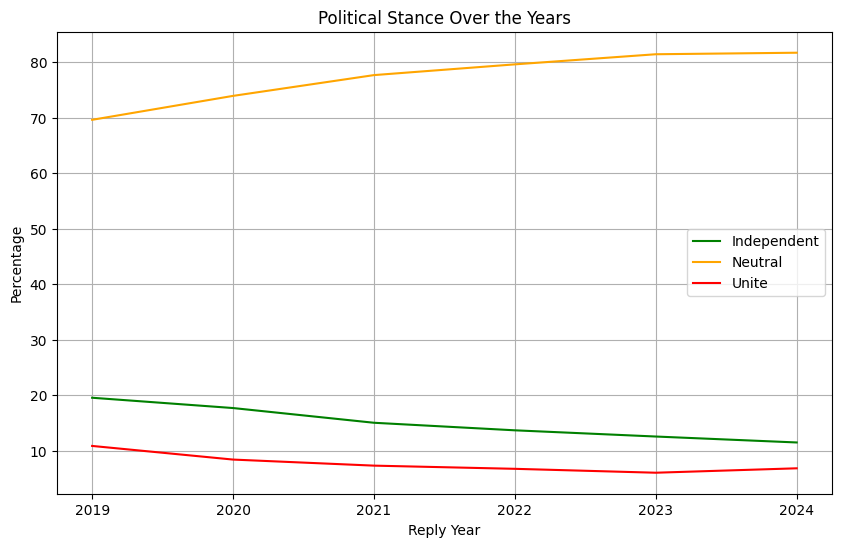

In [35]:
# prompt: using matplotlib.pyplot, plot a chart with grouped_year_df; x axis: reply_year; y axis: independent_percentage, neutral_percentage, and unite_percentage

import matplotlib.pyplot as plt

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(grouped_year_df['reply_year'], grouped_year_df['independent_percentage'], label='Independent', color='green')
plt.plot(grouped_year_df['reply_year'], grouped_year_df['neutral_percentage'], label='Neutral', color='orange')
plt.plot(grouped_year_df['reply_year'], grouped_year_df['unite_percentage'], label='Unite', color='red')

# Add labels and title
plt.xlabel('Reply Year')
plt.ylabel('Percentage')
plt.title('Political Stance Over the Years')

# Add legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


整體看下來中立的發言偏多，可能是因為雖然word cloud畫起來中國被提及次數超多，但也有非常多其他話題被討論，只是比較分散所以不會在文字雲上面顯現出來

In [36]:
year_no_neutral = grouped_year_df.drop(columns=['neutral_percentage', 'Neutral'])
year_no_neutral['Total'] = year_no_neutral['Independent'] + year_no_neutral['Unite']
year_no_neutral['independent_percentage'] = year_no_neutral['Independent']/year_no_neutral['Total'] * 100
year_no_neutral['unite_percentage'] = year_no_neutral['Unite']/year_no_neutral['Total'] * 100
year_no_neutral

LLM_judge,reply_year,Independent,Unite,Total,independent_percentage,unite_percentage
0,2019,436,242,678,64.306785,35.693215
1,2020,2250,1067,3317,67.832379,32.167621
2,2021,2265,1099,3364,67.330559,32.669441
3,2022,1774,872,2646,67.044596,32.955404
4,2023,1258,603,1861,67.598066,32.401934
5,2024,652,387,1039,62.752647,37.247353


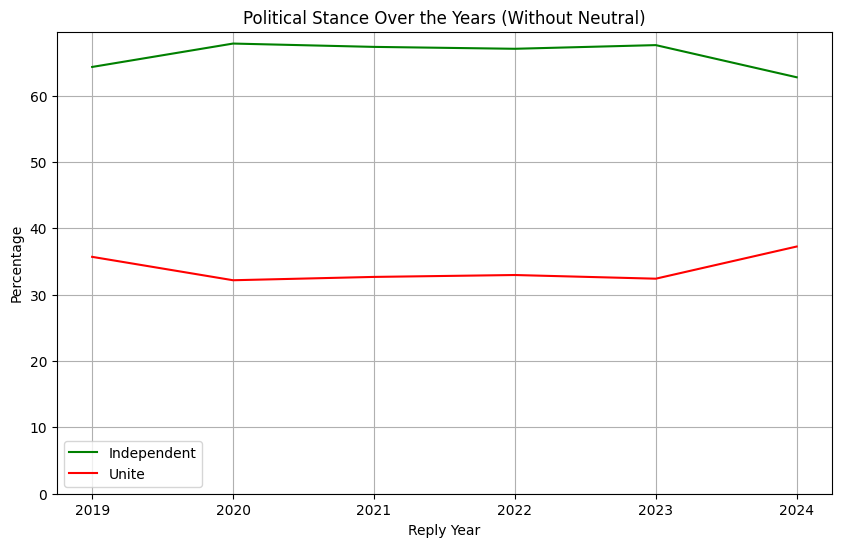

In [37]:
# prompt: plot a chart with year_no_neutral, with the lowest point in the y axis as 0

import matplotlib.pyplot as plt

# Create the figure
fig = plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(year_no_neutral['reply_year'], year_no_neutral['independent_percentage'], label='Independent', color='green')
plt.plot(year_no_neutral['reply_year'], year_no_neutral['unite_percentage'], label='Unite', color='red')

# Set the y-axis minimum to 0
plt.ylim(bottom=0)

# Add labels and title
plt.xlabel('Reply Year')
plt.ylabel('Percentage')
plt.title('Political Stance Over the Years (Without Neutral)')

# Add legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


#### Speculation

撇除中立言論不看，我們可以發現在2020年的時候，獨立言論特別多，可能因為疫情關係一堆人對中國生氣吧；不過疫情趨緩之後大家也漸漸回到原本的政治狀態

### Political Stance of Individual User Over the Years

In [38]:
# Group by reply_year and reply_Author, then count each LLM_judge variation
grouped_year_and_author_df = Non_NA_time_df.groupby(['reply_year', 'reply_Author', 'LLM_judge']).size().unstack(fill_value=0).reset_index()
grouped_year_and_author_df

LLM_judge,reply_year,reply_Author,Independent,Neutral,Unite
0,2019,-kerosene-,0,4,1
1,2019,01110100-01110111,1,3,0
2,2019,17_character_limit,0,2,0
3,2019,1kungfuhustler1,0,0,1
4,2019,1shmeckle,0,1,0
...,...,...,...,...,...
17367,2024,zkkzkk32312,0,1,0
17368,2024,zvekl,0,22,0
17369,2024,zvika,1,1,0
17370,2024,zztopsthetop,0,1,0


In [39]:
# prompt: # Create a score for each user each year, (NumOfIndependent - NumOfUnite)/(NumOfIndependent + NumOfNeutral + NumOfUnite);
# # > 0: independent; = 0: neutral; < 0: Unite

# Create a new column to store the score
grouped_year_and_author_df['score'] = (grouped_year_and_author_df['Independent'] - grouped_year_and_author_df['Unite']) / (grouped_year_and_author_df['Independent'] + grouped_year_and_author_df['Neutral'] + grouped_year_and_author_df['Unite'])

# Print the first few rows of the DataFrame
grouped_year_and_author_df.head()


LLM_judge,reply_year,reply_Author,Independent,Neutral,Unite,score
0,2019,-kerosene-,0,4,1,-0.20
1,2019,01110100-01110111,1,3,0,0.25
2,2019,17_character_limit,0,2,0,0.00
3,2019,1kungfuhustler1,0,0,1,-1.00
4,2019,1shmeckle,0,1,0,0.00


In [40]:
# prompt: Add another column indicating if the author is 'Independent', 'Neutral', or 'Unite'

import numpy as np
# Create a new column to indicate the author's political stance based on the score
grouped_year_and_author_df['author_stance'] = np.where(grouped_year_and_author_df['score'] > 0, 'Independent',
                                                   np.where(grouped_year_and_author_df['score'] < -0, 'Unite', 'Neutral'))

# Print the first few rows of the DataFrame
grouped_year_and_author_df


LLM_judge,reply_year,reply_Author,Independent,Neutral,Unite,score,author_stance
0,2019,-kerosene-,0,4,1,-0.20,Unite
1,2019,01110100-01110111,1,3,0,0.25,Independent
2,2019,17_character_limit,0,2,0,0.00,Neutral
3,2019,1kungfuhustler1,0,0,1,-1.00,Unite
4,2019,1shmeckle,0,1,0,0.00,Neutral
...,...,...,...,...,...,...,...
17367,2024,zkkzkk32312,0,1,0,0.00,Neutral
17368,2024,zvekl,0,22,0,0.00,Neutral
17369,2024,zvika,1,1,0,0.50,Independent
17370,2024,zztopsthetop,0,1,0,0.00,Neutral


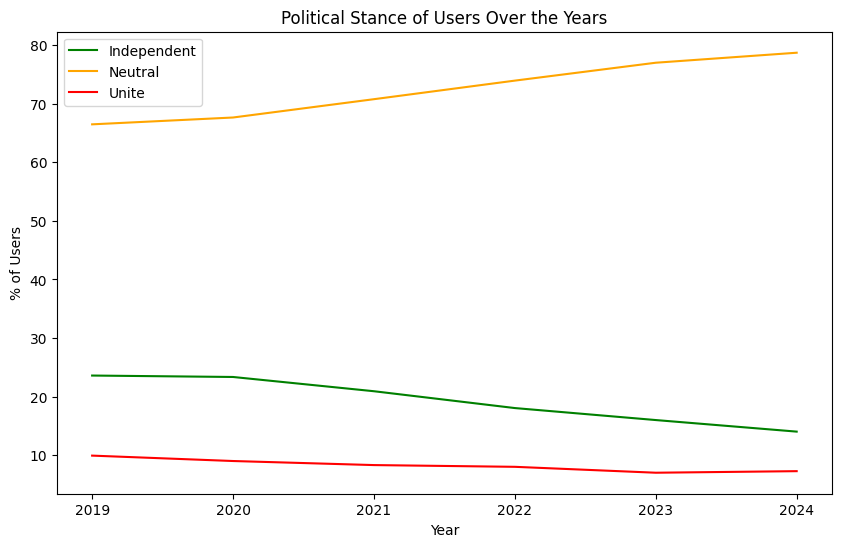

In [41]:
# prompt: Count the percentage of independent/neutral/unite users each year, and plot a chart, please draw "independent" as green, "unite" as red, and "neutral" as orange

import pandas as pd
import matplotlib.pyplot as plt
# Calculate the total number of users per year
total_users_per_year = grouped_year_and_author_df.groupby('reply_year')['reply_Author'].nunique()

# Calculate the number of users with each political stance per year
independent_users_per_year = grouped_year_and_author_df[grouped_year_and_author_df['author_stance'] == 'Independent'].groupby('reply_year')['reply_Author'].nunique()
neutral_users_per_year = grouped_year_and_author_df[grouped_year_and_author_df['author_stance'] == 'Neutral'].groupby('reply_year')['reply_Author'].nunique()
unite_users_per_year = grouped_year_and_author_df[grouped_year_and_author_df['author_stance'] == 'Unite'].groupby('reply_year')['reply_Author'].nunique()

# Calculate the percentage of users with each political stance per year
independent_percentage_per_year = independent_users_per_year / total_users_per_year * 100
neutral_percentage_per_year = neutral_users_per_year / total_users_per_year * 100
unite_percentage_per_year = unite_users_per_year / total_users_per_year * 100

# Create a DataFrame to store the results
stance_per_year_df = pd.DataFrame({
    'reply_year': independent_percentage_per_year.index,
    'independent_percentage': independent_percentage_per_year.values,
    'neutral_percentage': neutral_percentage_per_year.values,
    'unite_percentage': unite_percentage_per_year.values
})

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(stance_per_year_df['reply_year'], stance_per_year_df['independent_percentage'], color='green', label='Independent')
plt.plot(stance_per_year_df['reply_year'], stance_per_year_df['neutral_percentage'], color='orange', label='Neutral')
plt.plot(stance_per_year_df['reply_year'], stance_per_year_df['unite_percentage'], color='red', label='Unite')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('% of Users')
plt.title('Political Stance of Users Over the Years')

# Add legend
plt.legend()

# Show the plot
plt.show()


使用者的政治光譜看起來跟發言的差不多；差異就是比較平緩而已；
依舊是中立最多、獨立次之、統一最少

In [42]:
# prompt: Add new column to grouped_year_and_author_df, indicating if they changed their political stances: independent to neutral, neutral to unite, etc; don't use 'true, false', but record how it was changed; if that user didn't appear, mark as 'new'; if it didn't change, mark as 'no change'

import pandas as pd
def check_stance_change(df):
  """
  This function checks for changes in political stance for each user across years.

  Args:
      df (pd.DataFrame): DataFrame containing grouped data by year and author.

  Returns:
      pd.DataFrame: DataFrame with a new column indicating stance changes.
  """

  df["stance_change"] = "no change"

  for i in range(1, len(df)):
    current_year = df.loc[i, "reply_year"]
    current_author = df.loc[i, "reply_Author"]
    previous_year_df = df[df["reply_year"] < current_year]
    previous_author_data = previous_year_df[previous_year_df["reply_Author"] == current_author]

    if len(previous_author_data) > 0:
      previous_stance = previous_author_data.iloc[-1]["author_stance"]
      current_stance = df.loc[i, "author_stance"]

      if previous_stance != current_stance:
        df.loc[i, "stance_change"] = f"{previous_stance} to {current_stance}"

    else:
      df.loc[i, "stance_change"] = "new"

  return df

grouped_year_and_author_df = check_stance_change(grouped_year_and_author_df)

# Print the first few rows of the DataFrame
grouped_year_and_author_df


LLM_judge,reply_year,reply_Author,Independent,Neutral,Unite,score,author_stance,stance_change
0,2019,-kerosene-,0,4,1,-0.20,Unite,no change
1,2019,01110100-01110111,1,3,0,0.25,Independent,new
2,2019,17_character_limit,0,2,0,0.00,Neutral,new
3,2019,1kungfuhustler1,0,0,1,-1.00,Unite,new
4,2019,1shmeckle,0,1,0,0.00,Neutral,new
...,...,...,...,...,...,...,...,...
17367,2024,zkkzkk32312,0,1,0,0.00,Neutral,Independent to Neutral
17368,2024,zvekl,0,22,0,0.00,Neutral,no change
17369,2024,zvika,1,1,0,0.50,Independent,new
17370,2024,zztopsthetop,0,1,0,0.00,Neutral,new


In [43]:
# prompt: Calculate the number of each variation in stance_change each year

stance_change_counts = grouped_year_and_author_df.groupby(['reply_year', 'stance_change']).size().unstack(fill_value=0)

# Print the DataFrame
stance_change_counts


stance_change,Independent to Neutral,Independent to Unite,Neutral to Independent,Neutral to Unite,Unite to Independent,Unite to Neutral,new,no change
reply_year,,,,,,,,
2019,0,0,0,0,0,0,745,1
2020,33,14,69,21,16,14,2770,164
2021,152,33,108,49,27,45,2869,547
2022,190,30,142,59,27,57,2649,743
2023,195,26,129,38,26,76,2297,671
2024,137,25,89,40,17,48,1446,538
